In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from src.data_preparation.data_preparation import DataPreparation
from src.machine_learning.estimators import Estimators
from src.main_scripts.implemented import Implementations

In [2]:
analysis = Implementations()
prep = DataPreparation()

In [3]:
dataset = pd.read_excel('./databases/AMP_30_03_2020_IMPROVED.xlsx', index_col=0)

In [4]:
dataset

,ID,Name/Class,Source,Kingdom,"Celularity (Sing, Mult)","Tissue (Yes, No)","Mesoderm (Yes, NO)",Mouthparts(Pro-Deuter),Phyllum,Class,...,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_class,seq_mweight,seq_pi,Radius_gyration
Kolumna1,,,,,,,,,,,,,,,,,,,,,
0,AP00001,Dermaseptin-B2,"Giant leaf frog,",A,MUL,YES,YES,DEU,CHOR,AMPH,...,-0.373333,0.023333,-0.189091,-0.737273,0.112727,0.172424,Globular/Surface,3181.72634,10.502974,55.8820
1,AP00002,Abaecin,"honeybee, Apis mellifera",A,MUL,YES,YES,PRO,ARTH,HEX,...,0.139118,-0.252059,0.348529,-0.335294,0.408824,-0.308529,Globular,3878.49684,10.965017,29.9370
2,AP00003,Hs-AFP1,Heuchera sanguinea,A,MUL,YES,YES,PRO,ARTH,CHEL,...,-0.024259,0.241667,0.058519,0.087407,0.126481,-0.032593,Globular,5948.70564,8.213678,45.7830
3,AP00004,Ct-AMP1,Clitoria ternatea,P,MUL,NOT,NOT,NOT,ANGIO,DIC,...,0.071224,0.190408,-0.225306,0.301429,0.304898,0.138571,Globular,5614.25194,7.989076,31.0235
4,AP00005,Andropin,"Fruit fly, Drosophila melanogaster",A,MUL,YES,YES,PRO,ARTH,HEX,...,0.301471,-0.302941,0.045588,-0.462353,-0.018529,0.268824,Surface/Globular,3750.39884,7.547250,52.7405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2712,DRAMP18722,MA (Magainin 2 (9-21) truncated peptide),Xenopus laevis (African clawed frog),A,MUL,YES,YES,DEU,CHOR,AMPH,...,-0.180000,-0.007692,0.311538,-0.547692,0.417692,0.583077,Globular,1425.75224,10.506902,51.3330
5248,DRAMP18723,CE Cecropin A,Hyalophora cecropia (Cecropia moth),A,MUL,YES,YES,PRO,ARTH,HEX,...,-0.175000,0.063750,0.516250,-1.092500,0.615000,0.016250,Globular,1090.42024,11.278354,0.0000
5856,DRAMP18724,"Oncorhyncin III (Oncorhyncin-3, histone-derive...",Oncorhynchus mykiss (Rainbow trout) (Salmo gai...,A,MUL,YES,YES,DEU,CHOR,PISC,...,-0.113623,0.053043,-0.019130,-0.626232,0.240725,-0.108551,Globular,6956.03724,11.507281,94.6700


In [5]:
dataset.columns

Index(['ID', 'Name/Class', 'Source', 'Kingdom', 'Celularity (Sing, Mult)',
       'Tissue (Yes, No)', 'Mesoderm (Yes, NO)', 'Mouthparts(Pro-Deuter)',
       'Phyllum', 'Class', 'Age Tre of life', 'Sequence',
       'Hydrophobic_residue', 'Length', 'Net_charge', 'BomanIndex', 'Activity',
       'Abrev.', 'A_BACT', 'A_CANCER', 'A_VIRAL', 'A_FUNGAL', 'RANGE',
       'insta_index', 'Aliphatic', 'Aromatic', 'NonPolar', 'Polar', 'Charged',
       'Basic', 'Acidic', 'polarity', 'h_bonding', 'alfa_turn_prop',
       'bulky_prop', 'local_flex', 'electronic_prop', 'comp_char', 'seq_hydro',
       'helix_bend_pref', 'side_chain_size', 'pk_c', 'surro_hydro',
       'd_bend_pref', 'spec_vol', 'flat_pref', 'occ_alpha', 'seq_class',
       'seq_mweight', 'seq_pi', 'Radius_gyration'],
      dtype='object')

In [6]:
dataset.describe()

,Age Tre of life,Hydrophobic_residue,Length,Net_charge,BomanIndex,insta_index,Aliphatic,Aromatic,NonPolar,Polar,...,side_chain_size,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_mweight,seq_pi,Radius_gyration
count,2.367000e+03,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6542.000000,6545.000000,6545.000000,6545.000000,...,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000,6545.000000
mean,5.137828e+08,0.504010,35.687395,3.675172,0.987241,29.868777,9.474320,3.603972,21.022918,14.635905,...,-0.284320,-0.009288,0.105609,-0.061188,-0.271617,0.238328,0.036696,3909.572169,9.053103,42.340162
std,5.479458e+08,0.158014,20.708672,3.583859,1.626739,27.304607,5.994075,3.016091,11.442295,10.685057,...,0.267344,0.232058,0.210962,0.209612,0.392956,0.237271,0.284890,2308.908623,2.127515,46.521906
min,0.000000e+00,0.000000,2.000000,-20.000000,-3.823333,-43.433333,0.000000,0.000000,0.000000,0.000000,...,-1.458333,-1.485000,-0.882727,-1.200000,-1.616364,-1.520000,-1.522000,260.290140,2.602637,0.000000
25%,2.700000e+08,0.384615,21.000000,1.000000,-0.023333,10.266000,6.000000,2.000000,13.000000,7.000000,...,-0.457027,-0.150645,-0.022143,-0.178182,-0.562222,0.097143,-0.124737,2209.791240,8.111385,17.649500
50%,2.700000e+08,0.487805,31.000000,3.000000,0.980000,27.131884,9.000000,3.000000,19.000000,12.000000,...,-0.295132,0.000303,0.111333,-0.057059,-0.288605,0.242899,0.025684,3275.921240,9.537301,33.649500
75%,4.600000e+08,0.617647,45.000000,6.000000,1.967027,45.139474,12.000000,5.000000,26.000000,20.000000,...,-0.127500,0.138333,0.234643,0.061250,0.044419,0.388235,0.201429,4939.982940,10.512673,51.676500
max,3.800000e+09,1.000000,174.000000,30.000000,40.433333,305.690323,42.000000,27.000000,130.000000,82.000000,...,1.498333,1.115000,1.043333,1.183333,1.165833,1.142727,1.797632,19198.367240,13.932011,840.744000


/home/arjissuan/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


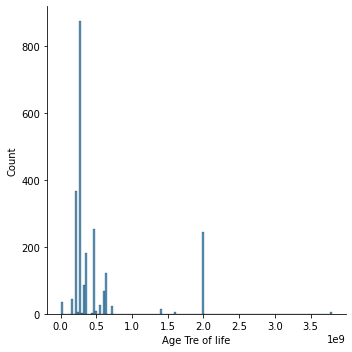

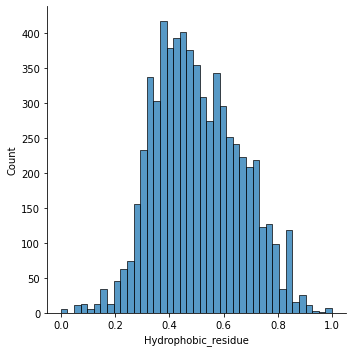

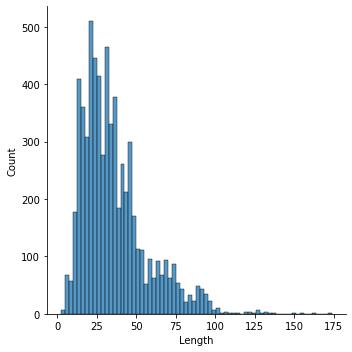

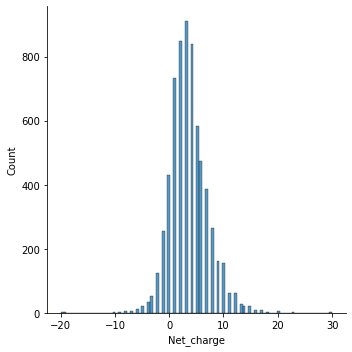

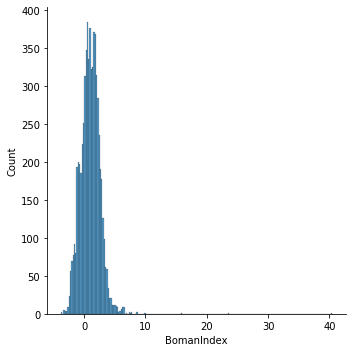

...

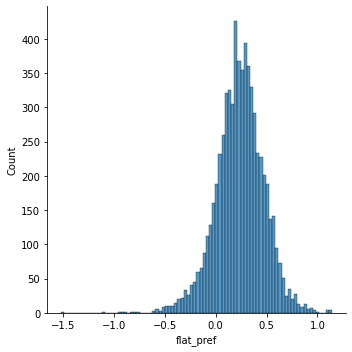

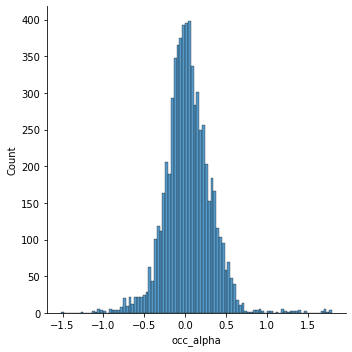

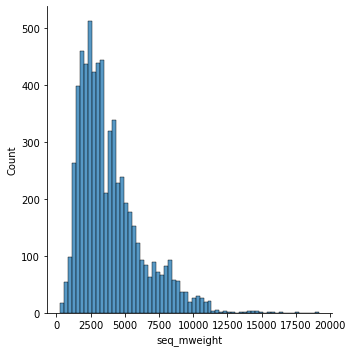

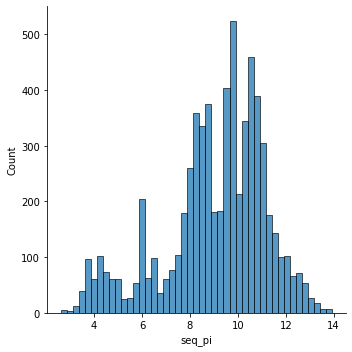

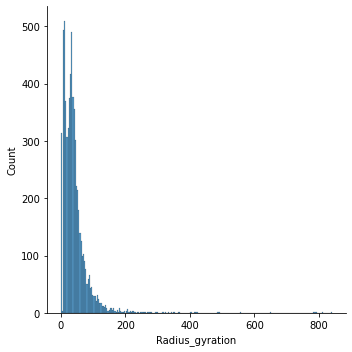

In [7]:
columny = dataset.describe()
columny = columny.columns
for col in columny:
    sns.displot(dataset[col])

<AxesSubplot:>

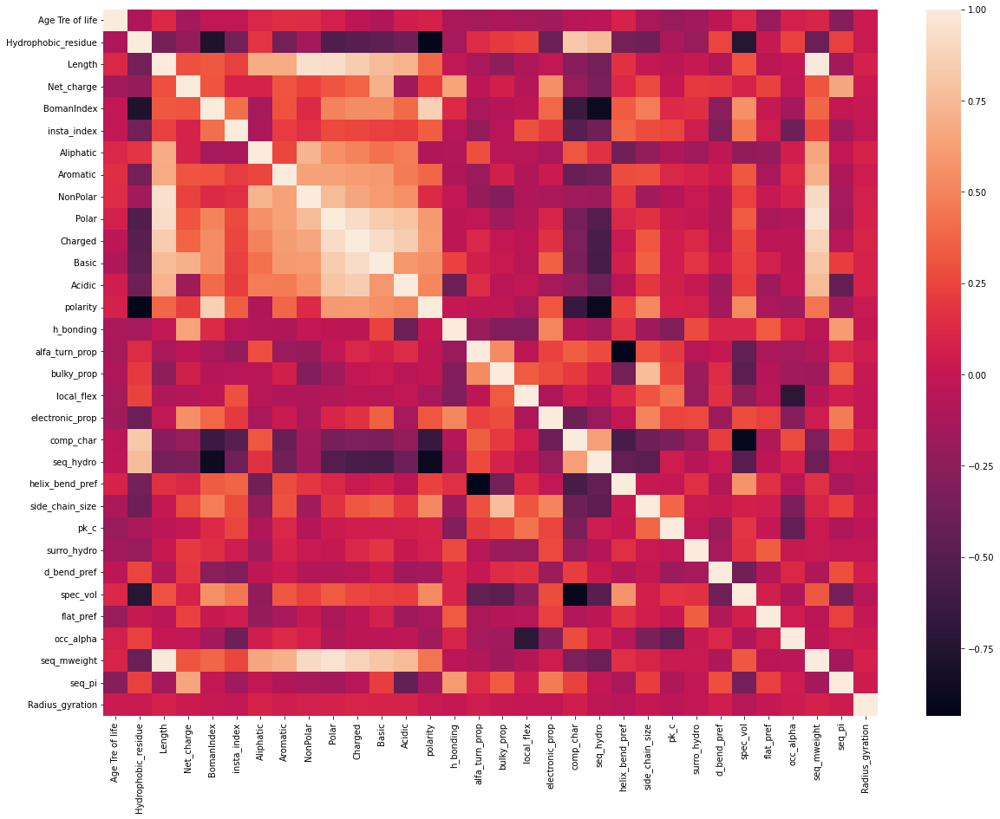

In [8]:
corrmat = dataset.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corrmat)

<AxesSubplot:>

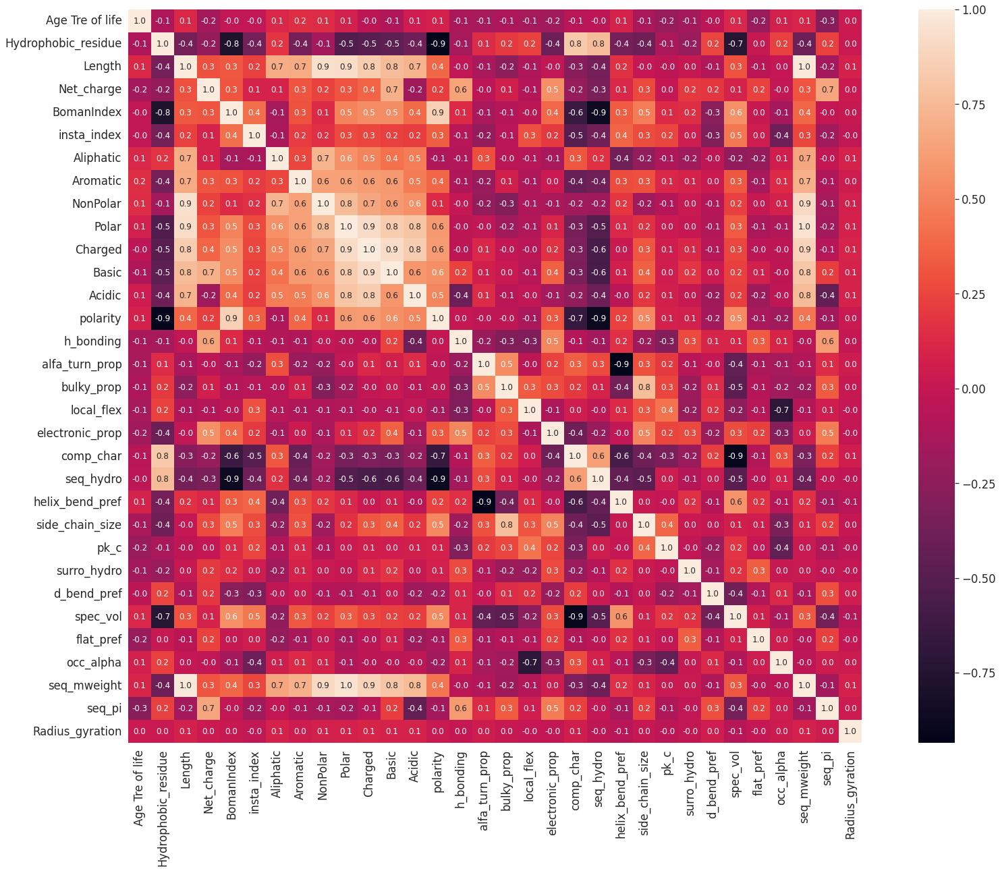

In [9]:
# wykonanie tego samego przy uzyciu funkcji numpy(nie maskuje ona automatycznie wartosci None)
vals = dataset[columny].values.T
corr_test= np.ma.corrcoef(np.ma.masked_invalid(vals))
plt.figure(figsize=(30,20))
sns.set(font_scale=1.5)
sns.heatmap(corr_test,cbar=True, annot=True, square=True,fmt='.1f', annot_kws={'size':12}, yticklabels=columny, xticklabels=columny)


<AxesSubplot:>

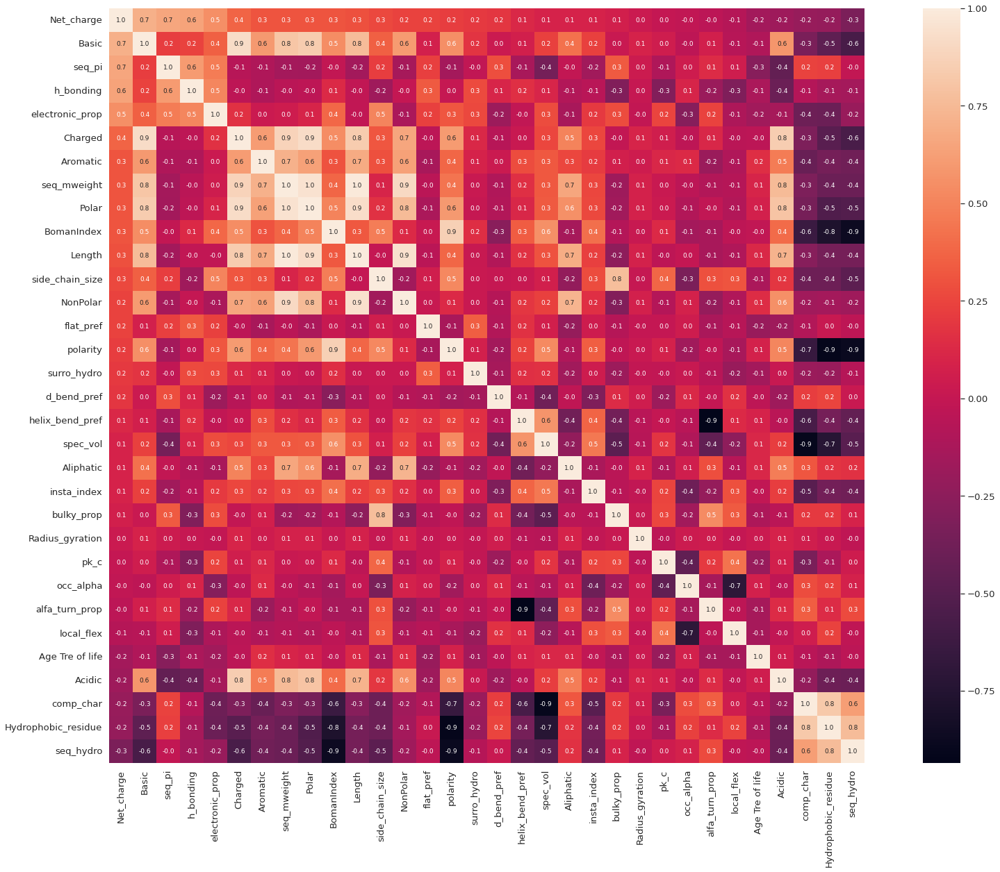

In [10]:
# uszeregowanie najmocniejszych do najslabszych korelacji do net_charge
k=100
corr_to_net = corrmat.nlargest(k, 'Net_charge')['Net_charge']
values = dataset[corr_to_net.index].values.T
corr = np.ma.corrcoef(np.ma.masked_invalid(values))
sns.set(font_scale=1.2 )
plt.figure(figsize=(30,20))
sns.heatmap(corr, cbar=True, annot=True, square=True, fmt='.1f', annot_kws={'size':9}, yticklabels=corr_to_net.index, xticklabels=corr_to_net.index)



In [11]:
#zagubione dane
total = dataset.isnull().sum().sort_values(ascending=False)
percent = (dataset.isnull().sum()/dataset.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing

,Total,Percent
Age Tre of life,4178,0.638350
Abrev.,4178,0.638350
polarity,76,0.011612
h_bonding,76,0.011612
Aliphatic,3,0.000458
ID,0,0.000000
seq_hydro,0,0.000000
Basic,0,0.000000
Acidic,0,0.000000
alfa_turn_prop,0,0.000000


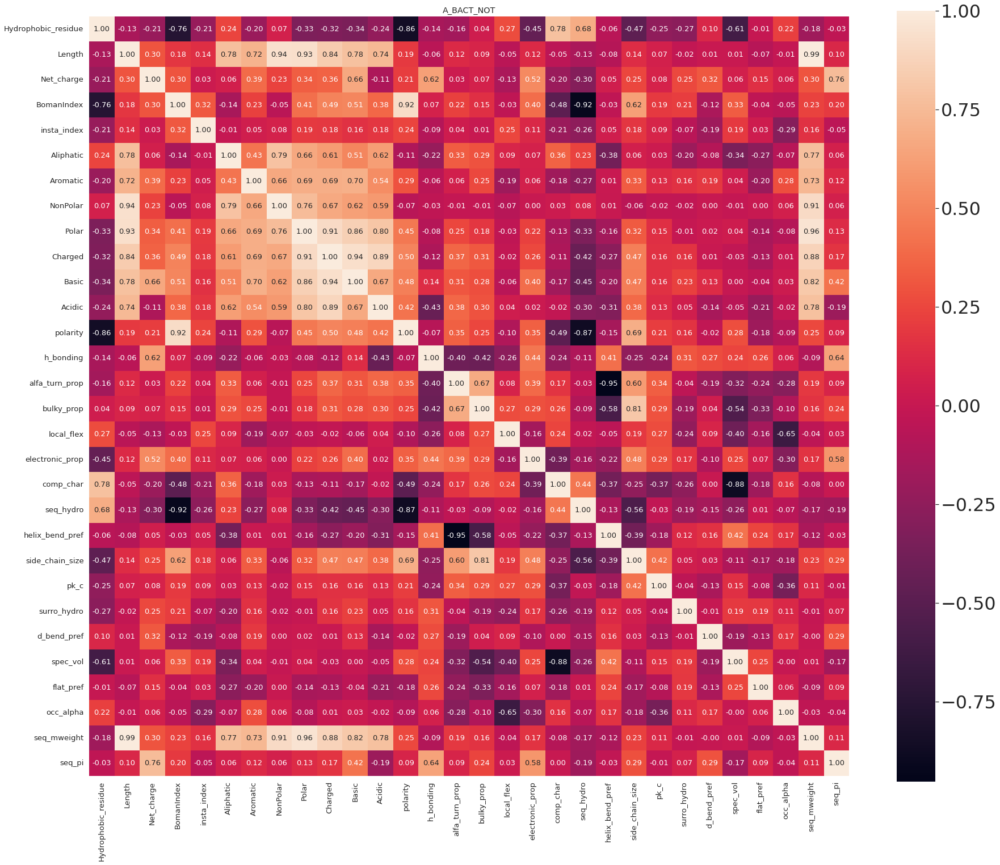

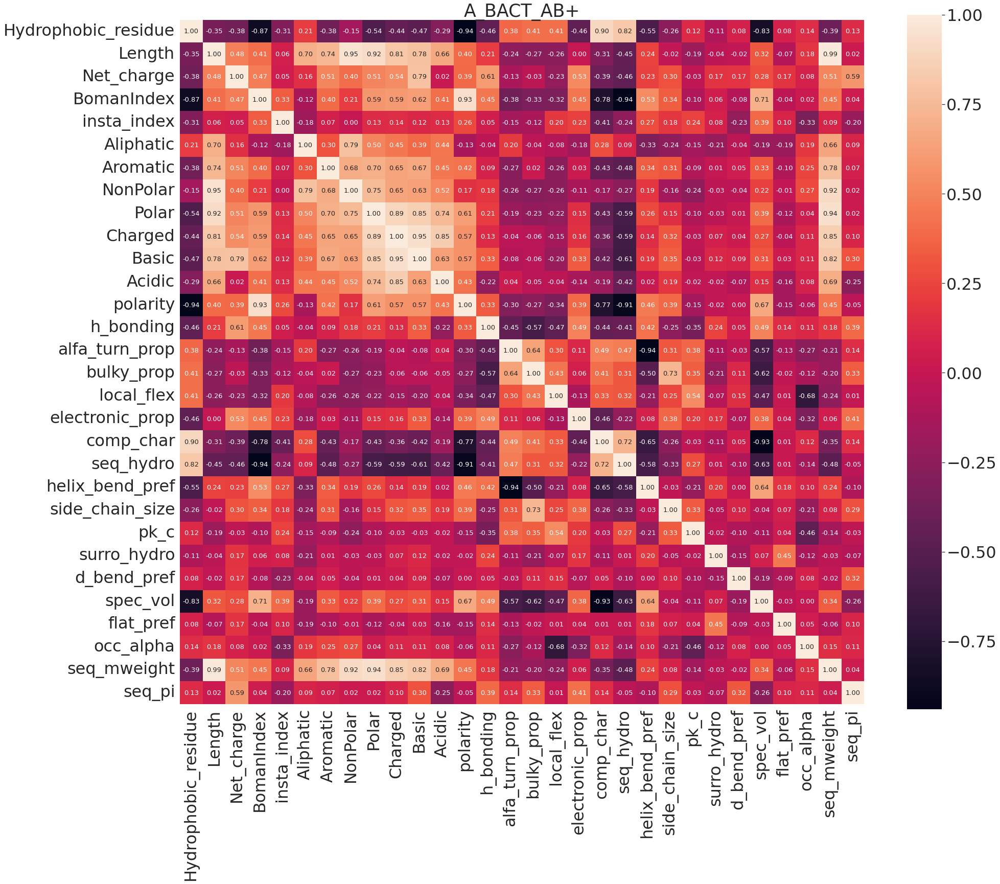

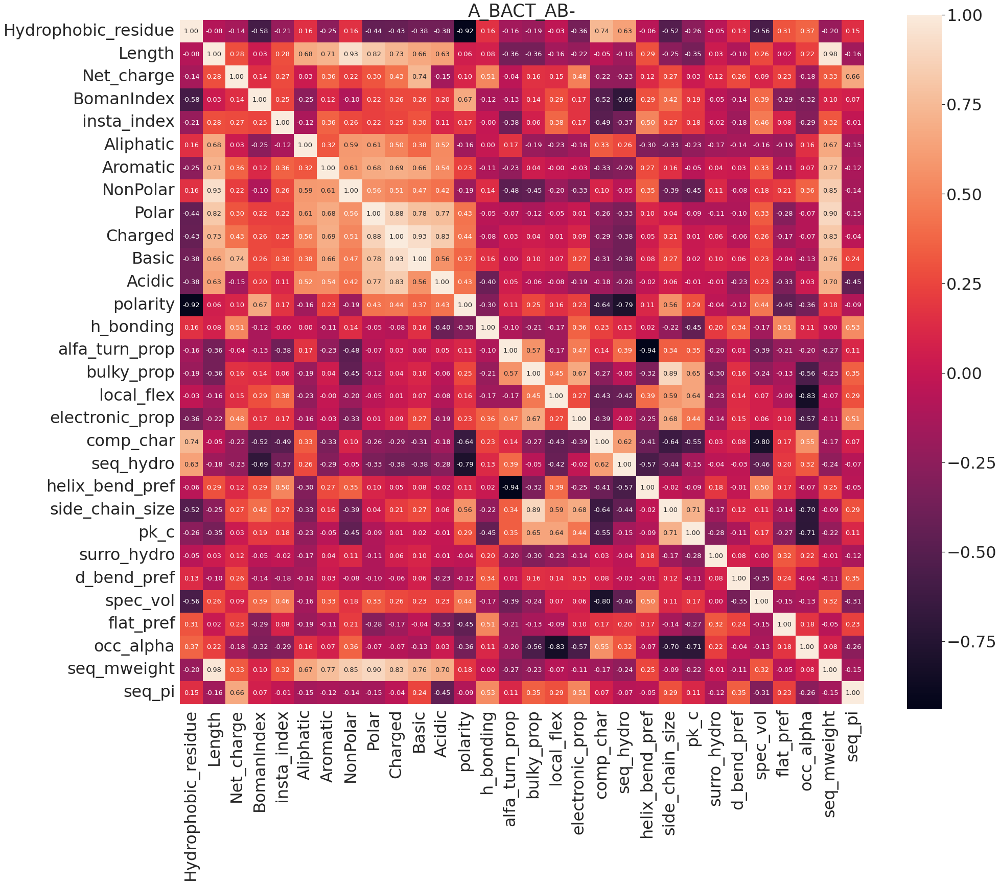

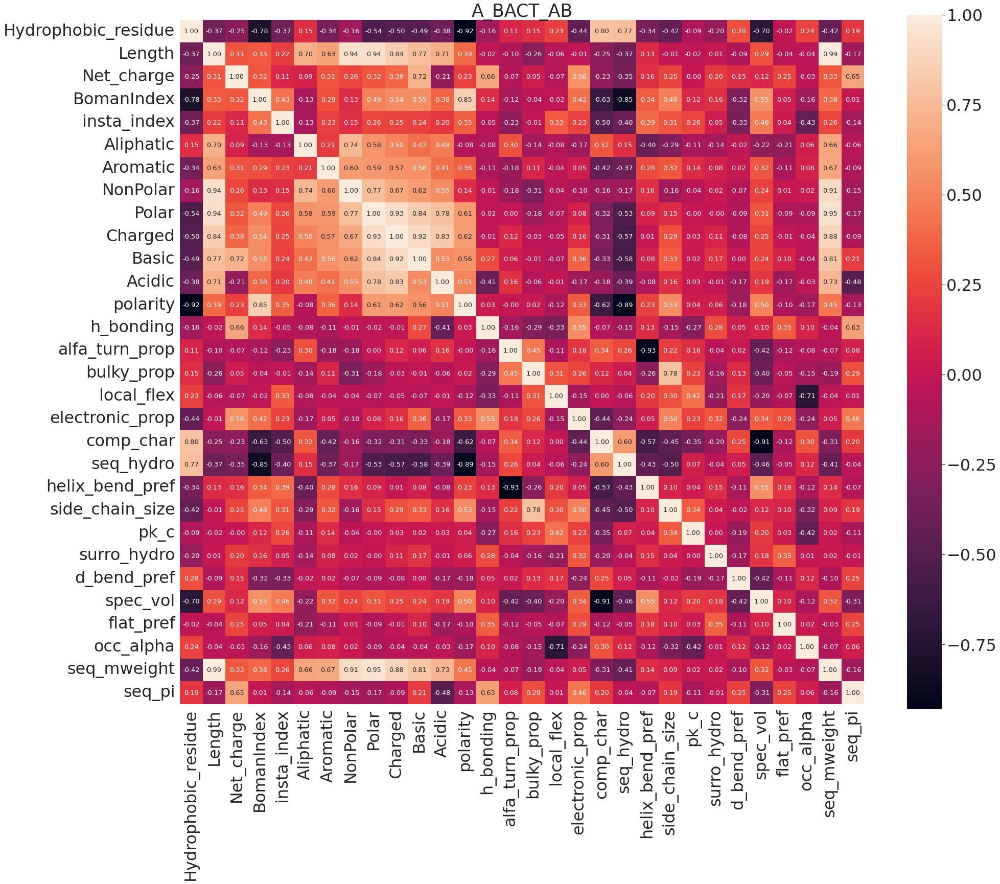

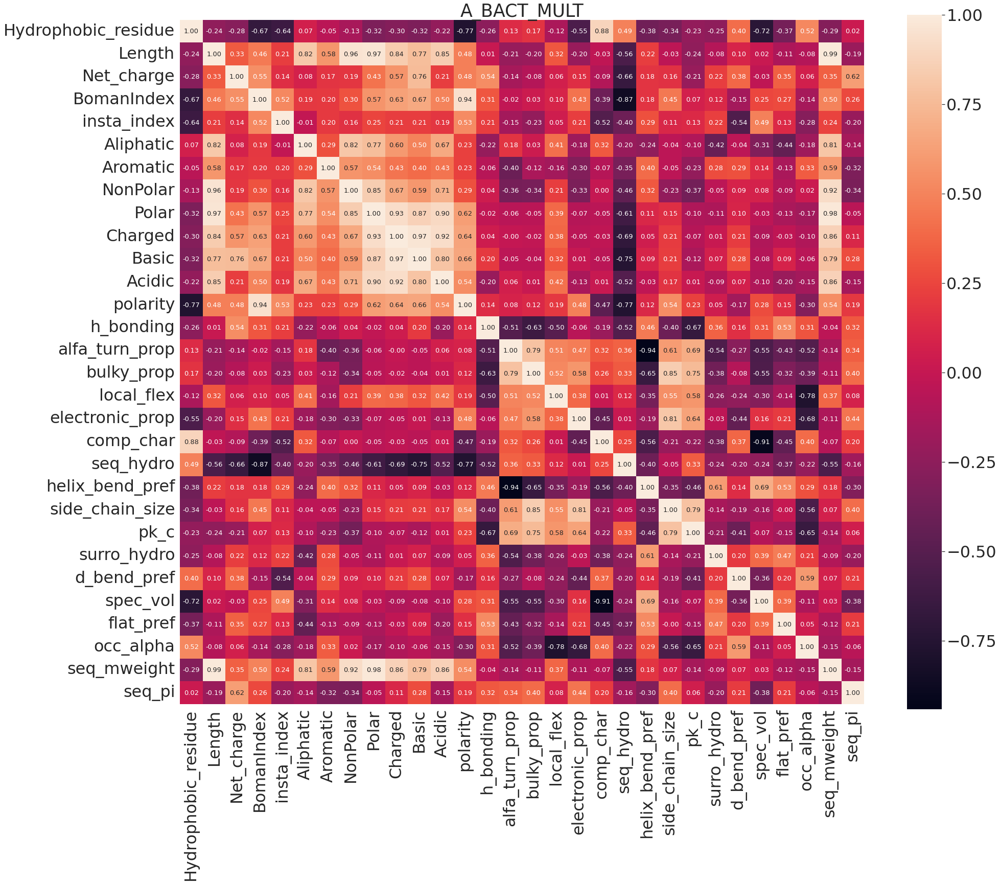

...

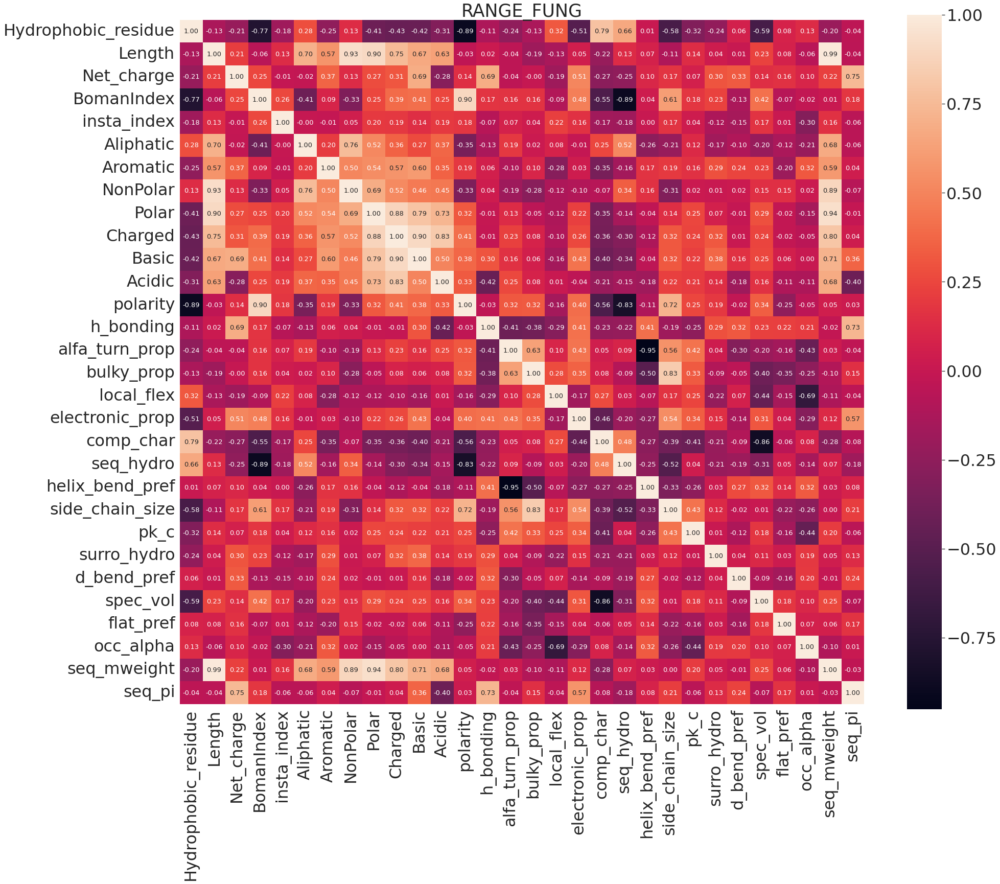

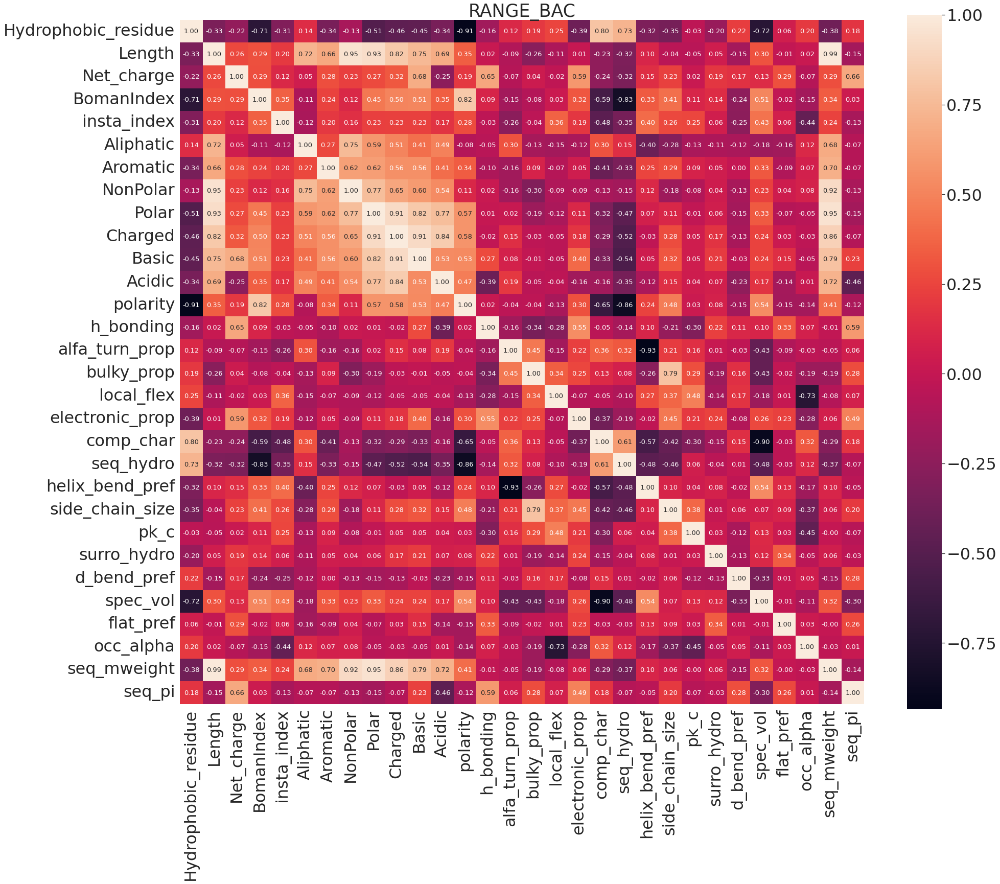

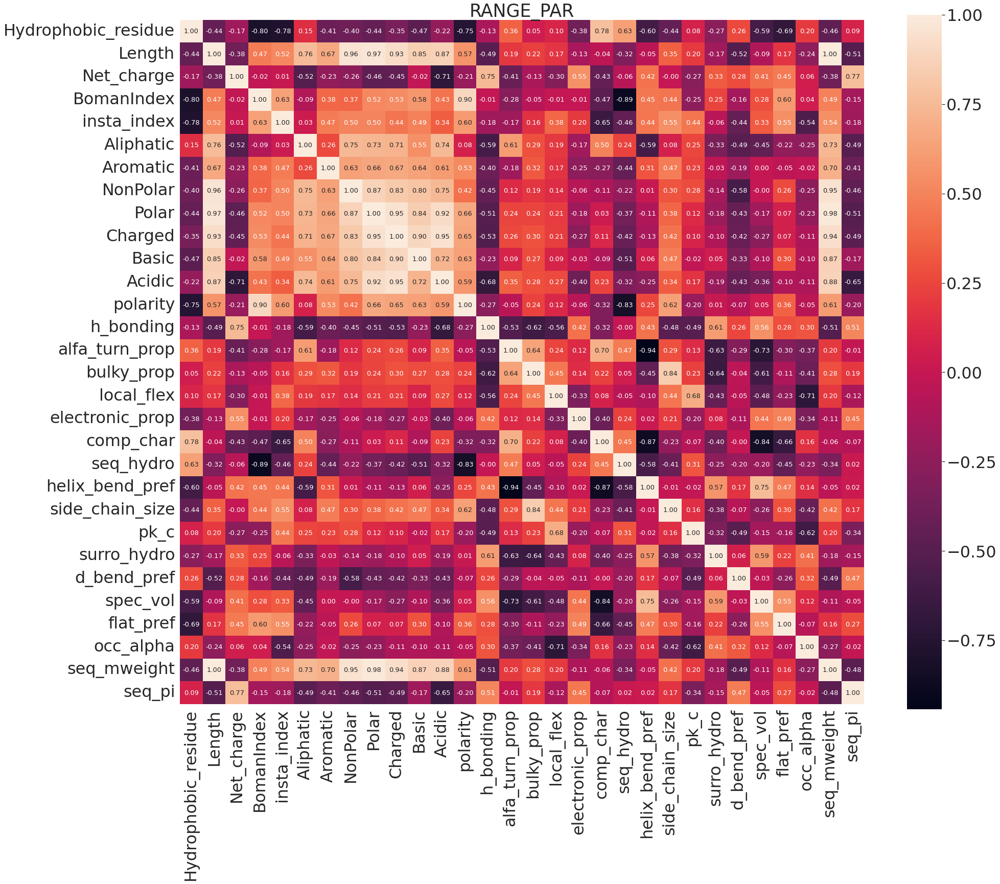

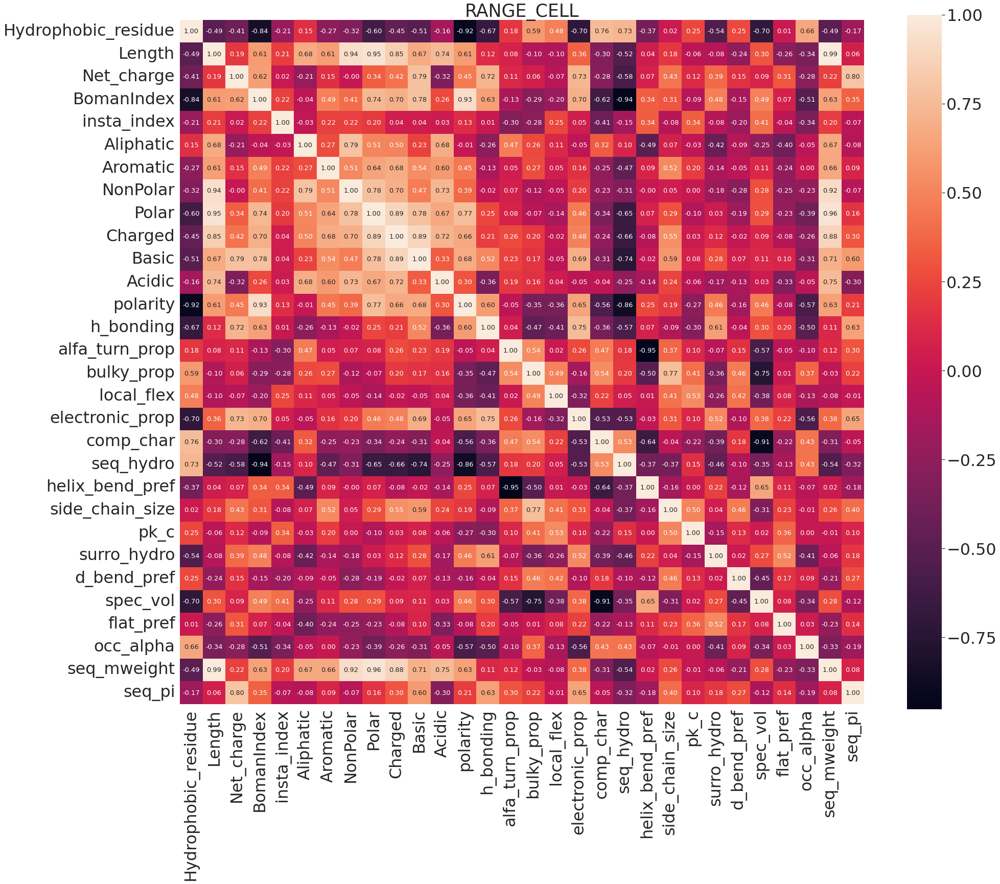

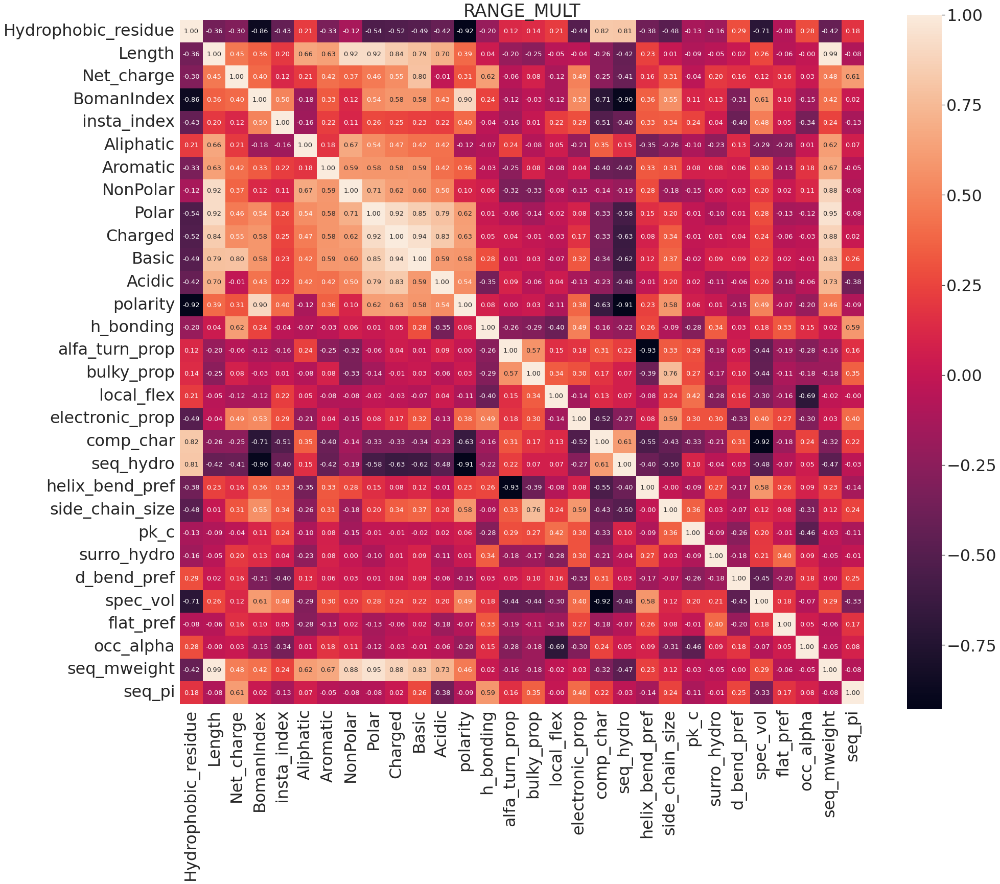

In [12]:
analysis.clasterization_results(df=prep.get_dataset(),size=(30,25), font_scale=2.9, fmt='.2f', annota=13)

In [13]:
for indx, col in enumerate(prep.columns):
    df = prep.clsterization(indx, prep.get_dataset())
    auto_lengths = lambda x: (x, len(df[x]))
    clasters_leng = dict(map(auto_lengths, df.keys()))
    print(clasters_leng)

{'A_BACT_NOT': 990, 'A_BACT_AB+': 744, 'A_BACT_AB-': 303, 'A_BACT_AB': 4478, 'A_BACT_MULT': 30}
{'A_VIRAL_NOT': 6161, 'A_VIRAL_AV': 384}
{'A_CANCER_NOT': 6253, 'A_CANCER_AC': 292}
{'A_FUNGAL_AF': 2392, 'A_FUNGAL_NOT': 4153}
{'RANGE_VIR': 99, 'RANGE_CANC': 50, 'RANGE_INSEC': 67, 'RANGE_FUNG': 613, 'RANGE_BAC': 3356, 'RANGE_PAR': 18, 'RANGE_CELL': 67, 'RANGE_MULT': 2275}


In [14]:
choosen = prep.get_chosen_seqs()
choosen

,ID,Name/Class,Source,Kingdom,"Celularity (Sing, Mult)","Tissue (Yes, No)","Mesoderm (Yes, NO)",Mouthparts(Pro-Deuter),Phyllum,Class,...,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_class,seq_mweight,seq_pi,Radius_gyration
0,DRAMP00746,Flower-specific defensin (NaD1; Plant defensin),Nicotiana alata (Winged tobacco) (Persian toba...,P,MUL,NOT,NOT,NOT,ANGIO,NOT,...,0.215319,0.208511,-0.158723,0.116809,0.393830,-0.325319,Globular,5304.31934,8.800562,10.6335
1,DRAMP00764,Piceain 1 (Plants),Picea sitchensis,P,MUL,NOT,NOT,NOT,ANGIO,NOT,...,0.134500,0.203500,-0.063000,-0.415000,0.459500,-0.312500,Globular,2538.20294,11.777672,59.6545
2,DRAMP00767,ChaC1 (Chassatide C1; Plant defensin),Chassalia chartacea,P,MUL,NOT,NOT,NOT,ANGIO,NOT,...,0.099655,0.083793,-0.327586,0.445172,0.455172,-0.038966,Globular/Transmembrane,3016.37534,4.184239,10.6265
3,DRAMP00774,Hedyotide B1 (hB1; Plants),Hedyotis biflora (aerial tissues),P,MUL,NOT,NOT,NOT,ANGIO,NOT,...,0.064667,0.247667,-0.174000,0.191333,0.627333,0.123000,Globular,3428.99974,8.377717,28.9380
4,DRAMP00795,Cliotide T1 (cT1; Plant defensin),Clitoria ternatea (Butterfly pea),P,MUL,NOT,NOT,NOT,ANGIO,NOT,...,0.121000,0.017000,-0.182667,0.186333,0.197333,-0.035667,Transmembrane/Globular,3123.74484,8.111385,116.6805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,AP02424,Crotalicidin,"venom gland, South American pit vipers, Crotal...",A,MUL,YES,YES,DEU,CHOR,REPT,...,0.011176,0.170000,0.620588,-0.855882,0.437059,0.007647,Globular/Surface/Transmembrane,4152.36574,12.656665,42.2075
198,AP02479,SmHep2P,"Turbot, Scophthalmus maximus",A,MUL,YES,YES,DEU,CHOR,PISC,...,0.398636,0.367727,-0.048636,0.650909,0.934545,0.286818,Globular,2406.96624,8.208580,27.0780
199,AP02525,Labyrinthopeptin,Actinomadura namibiensis,B,SING,NOT,NOT,NOT,NOT,NOT,...,-0.163889,0.247222,-0.557778,0.223333,0.001667,-0.366667,Globular,1998.24494,3.550038,131.6210
200,DRAMP00024,CylLS (a structural subunit of cytolysin; Bact...,Enterococcus faecalis (Gram-positive bacteria),PRO,SING,NOT,NOT,NOT,ANGIO,NOT,...,0.083333,0.105238,-0.118095,-0.334762,0.414762,0.039524,Globular/Transmembrane,2104.50984,8.229679,44.6850


In [15]:
choosen.describe()

,Age Tre of life,Hydrophobic_residue,Length,Net_charge,BomanIndex,insta_index,Aliphatic,Aromatic,NonPolar,Polar,...,side_chain_size,pk_c,surro_hydro,d_bend_pref,spec_vol,flat_pref,occ_alpha,seq_mweight,seq_pi,Radius_gyration
count,7.300000e+01,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,5.158904e+08,0.524749,30.333333,4.179487,0.836616,28.746555,8.676923,3.097436,18.687179,11.646154,...,-0.284085,-0.019631,0.131668,-0.073951,-0.297995,0.278028,0.048377,3301.459934,9.583245,45.407403
std,6.644397e+08,0.163454,18.539917,3.729734,1.583995,30.233900,5.718773,2.809363,10.493473,9.076020,...,0.318622,0.245983,0.216218,0.246259,0.445089,0.257046,0.289369,2006.111705,2.068051,38.866059
min,0.000000e+00,0.000000,5.000000,-4.000000,-3.350000,-22.641667,0.000000,0.000000,4.000000,0.000000,...,-1.454000,-0.819375,-0.517714,-0.723889,-1.208571,-0.471200,-0.816000,407.441740,3.491860,0.000000
25%,2.000000e+08,0.394737,20.000000,2.000000,-0.323235,9.086343,5.000000,1.000000,12.000000,6.000000,...,-0.477200,-0.165278,-0.002660,-0.216500,-0.645714,0.132360,-0.124500,2122.665990,8.376341,24.737500
50%,2.700000e+08,0.545455,25.000000,4.000000,0.690833,22.613333,8.000000,2.000000,17.000000,10.000000,...,-0.316154,-0.011250,0.139600,-0.067368,-0.362632,0.293462,0.052941,2779.466640,10.068130,36.162500
75%,3.600000e+08,0.652174,36.000000,6.000000,1.917656,40.932982,11.000000,4.000000,21.000000,14.500000,...,-0.092538,0.163125,0.282143,0.114600,0.010670,0.432361,0.219810,3874.647940,10.804063,55.720250
max,3.800000e+09,0.850000,133.000000,30.000000,6.064545,166.169697,35.000000,17.000000,69.000000,65.000000,...,0.977692,0.582353,0.760000,0.620588,1.165833,1.018571,0.927708,15518.743440,13.201066,364.661000


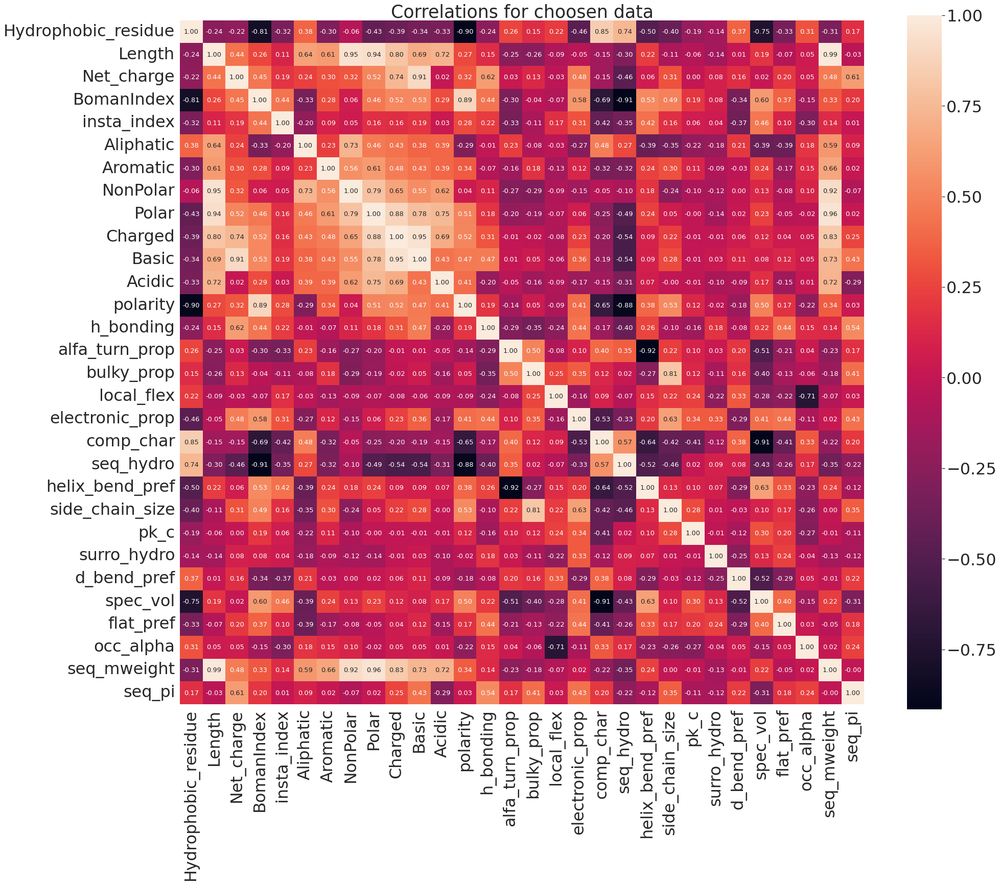

In [16]:
corr_chosen = prep.correlation(choosen)
prep.heatmaps(corr_chosen, 'Correlations for choosen data', size=(30,25), font_scale=2.9, fmt='.2f', annota=13)

In [ ]:
analysis.